# Metrics Investigation


In [230]:
# Add ldcpy root to system path
import sys

import astropy

sys.path.insert(0, '/Users/alex/git/ldcpy')

# Import ldcpy package
# Autoreloads package everytime the package is called, so changes to code will be reflected in the notebook if the above sys.path.insert(...) line is uncommented.
%load_ext autoreload
%autoreload 2

# suppress all of the divide by zero warnings
import warnings

warnings.filterwarnings("ignore")

import ldcpy

# display the plots in this notebook
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [231]:
sys.path

['/Users/alex/git/ldcpy',
 '/Users/alex/git/ldcpy',
 '/Users/alex/git/lcr/notebooks',
 '/opt/miniconda3/envs/ldcpy_a/lib/python38.zip',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8/lib-dynload',
 '',
 '/Users/alex/.local/lib/python3.8/site-packages',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8/site-packages']

## Overview


This notebook demonstrates the use of ldcpy on the sample data included with
this package. It explains how to open datasets (and view metadata), display
basic statistics about the data, and create both time-series and spatial plots
of the datasets and related quantitiess. Plot examples start out with the essential
arguments, and subsequent examples explore the additional plotting options that
are available.

For information about installation, see
[these instructions](https://ldcpy.readthedocs.io/en/latest/installation.html),
and for information about usage, see the API reference
[here](https://ldcpy.readthedocs.io/en/latest/api.html#ldcpy.plot.plot).


## Loading Datasets and Viewing Metadata


The first step in comparing the data is to load the data from the files that we
are interested into a "collection" for ldcpy to use. To do this, we use
ldcpy.open_datasets(). This function requires the following three arguments:

- _varnames_ : the variable(s) of interest to combine across files (typically
  the timeseries file variable name)
- _list_of_files_ : a list of full file paths (either relative or absolute)
- _labels_ : a corresponding list of names (or labels) for each file in the
  collection

Note: This function is a wrapper for xarray.open_mfdatasets(), and any
additional key/value pairs passed in as a dictionary are used as arguments to
xarray.open_mfdatasets(). For example, specifying the chunk size ("chunks") will
be important for large data (see LargeDataGladeNotebook.ipynb for more
information and an example).

We setup three different collections of timeseries datasets in these examples:

- _col_ts_ contains daily surface temperature (TS) data (2D data) for 100 days
- _col_prect_ contains daily precipitation rate (PRECT) data (2D data) for 60 days
- _col_t_ contains monthly temperature (T) data (3D data) for 3 months

These datasets are collections of variable data from several different netCDF
files, which are given labels in the third parameter to the
ldcpy.open_datasets() function. These names/labels can be whatever you want
(e.g., "orig", "control", "bob", ...), but they should be informative because
the names will be used to select the appropriate dataset later and as part of
the plot titles.

In this example, in each dataset collection we include a file with the original
(uncompressed) data as well as additional file(s) with the same data subject to
different levels of lossy compression.

_Note: If you do not need to get the data from files (e.g., you have already
used xarray.open_dataset()), then use ldcpy.collect_datasets() instead of
ldcpy.open_datasets (see example in AWSDataNotebook.ipynb)._


In [232]:
p = '/Users/alex/git/ldcpy'

# col_ts is a collection containing TS data
col_ts = ldcpy.open_datasets(
    "cam-fv",
    ["TS"],
    [
        f"{p}/data/cam-fv/orig.TS.100days.nc",
        f"{p}/data/cam-fv/zfp1.0.TS.100days.nc",
        f"{p}/data/cam-fv/zfp1e-1.TS.100days.nc",
    ],
    ["orig", "zfpA1.0", "zfpA1e-1"],
)
# col_prect contains PRECT data
col_prect = ldcpy.open_datasets(
    "cam-fv",
    ["PRECT"],
    [
        f"{p}/data/cam-fv/orig.PRECT.60days.nc",
        f"{p}/data/cam-fv/zfp1e-7.PRECT.60days.nc",
        f"{p}/data/cam-fv/zfp1e-11.PRECT.60days.nc",
    ],
    ["orig", "zfpA1e-7", "zfpA1e-11"],
)
# col_t contains 3D T data (here we specify the chunk to be a single timeslice)
col_t = ldcpy.open_datasets(
    "cam-fv",
    ["T"],
    [
        f"{p}/data/cam-fv/cam-fv.T.3months.nc",
        f"{p}/data/cam-fv/c.fpzip.cam-fv.T.3months.nc",
    ],
    ["orig", "comp"],
    chunks={"time": 1},
)

dataset size in GB 0.07

dataset size in GB 0.04

dataset size in GB 0.04



In [241]:
ds = col_ts.isel(time=0)

# Compression Comparison (Visuals and Metrics)


In [242]:
# without weighted means
ldcpy.compare_stats(ds, "TS", ["orig", "zfpA1.0", "zfpA1e-1"], significant_digits=6, weighted=False)

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


,orig,zfpA1.0,zfpA1e-1
mean,274.714,274.708,274.713
variance,534.006,533.681,533.985
standard deviation,23.1088,23.1017,23.1083
min value,216.741,216.816,216.747
max value,315.584,315.57,315.576
probability positive,1,1,1
number of zeros,0,0,0
spatial autocorr - latitude,0.993918,0.993911,0.993918
spatial autocorr - longitude,0.996801,0.996791,0.996801
entropy estimate,0.414723,0.247491,0.347534


,zfpA1.0,zfpA1e-1
max abs diff,0.405884,0.0229187
min abs diff,0,0
mean abs diff,0.0585202,0.00422603
mean squared diff,3.32617e-05,1.51646e-07
root mean squared diff,0.075273,0.00533574
normalized root mean squared diff,0.000761543,5.39821e-05
normalized max pointwise error,0.00410636,0.00023187
pearson correlation coefficient,0.999995,1
ks p-value,1,1
spatial relative error(% > 0.0001),68.958,0


274.7137027669836
274.707935474537
274.7133133499711


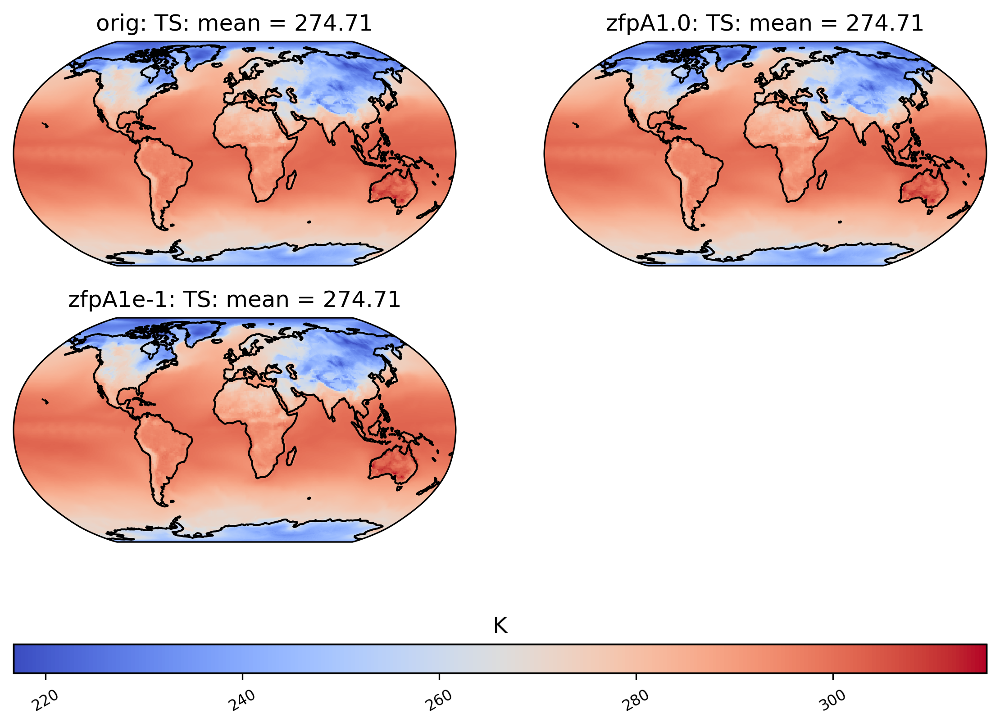

In [243]:
ds = ds.expand_dims(dim="time")
ldcpy.plot(ds, "TS", sets=["orig", "zfpA1.0", "zfpA1e-1"], calc="mean", weighted=False)

# Noise Comparison (Visuals and Metrics)


In [237]:
import numpy as np
scale = np.logspace(-4, -1, num=18)

noise1 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[0], [192,288])
noise_1 = ds.sel(collection="orig") + noise1
#noise_1 = noise_1.expand_dims(dim="time")

noise2 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[1], [192,288])
noise_2 = ds.sel(collection="orig") + noise2
#noise_2 = noise_2.expand_dims(dim="time")

noise3 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[2], [192,288])
noise_3 = ds.sel(collection="orig") + noise3
#noise_3 = noise_3.expand_dims(dim="time")

noise4 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[3], [192,288])
noise_4 = ds.sel(collection="orig") + noise4
#noise_4 = noise_4.expand_dims(dim="time")

noise5 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[4], [192,288])
noise_5 = ds.sel(collection="orig") + noise5
#noise_5 = noise_5.expand_dims(dim="time")

noise6 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[5], [192,288])
noise_6 = ds.sel(collection="orig") + noise6
#noise_6 = noise_6.expand_dims(dim="time")

noise7 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[6], [192,288])
noise_7 = ds.sel(collection="orig") + noise7
#noise_7 = noise_7.expand_dims(dim="time")

noise8 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[7], [192,288])
noise_8 = ds.sel(collection="orig") + noise8
#noise_8 = noise_8.expand_dims(dim="time")

noise9 = np.random.normal(0, ds.sel(collection="orig").std().compute()["TS"] * scale[8], [192,288])
noise_9 = ds.sel(collection="orig") + noise9
#noise_9 = noise_9.expand_dims(dim="time")

noise_ds = ldcpy.collect_datasets("cam-fv", 
                                  ["TS"], 
                                  [ds.sel(collection="orig"), noise_1, noise_2, noise_3, noise_4, noise_5, noise_6, noise_7, noise_8, noise_9],
                                  ["orig", "noise_1", "noise_2", "noise_3", "noise_4", "noise_5", "noise_6", "noise_7", "noise_8", "noise_9"])
noise_ds.attrs["file_size"] = None

dataset size in GB 0.44



In [238]:
# without weighted means
ldcpy.compare_stats(noise_ds, "TS", ["orig", "noise_1", "noise_2",
                                     "noise_3", "noise_4", "noise_5",
                                     "noise_6", "noise_7", "noise_8",
                                     "noise_9"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,noise_1,noise_2,noise_3,noise_4,noise_5,noise_6,noise_7,noise_8,noise_9
mean,274.714,274.714,274.714,274.714,274.714,274.714,274.714,274.714,274.714,274.714
variance,534.006,534.007,534.006,534.007,534.007,534.006,534.006,534.004,534,534.022
standard deviation,23.1088,23.1088,23.1088,23.1088,23.1088,23.1088,23.1088,23.1087,23.1087,23.1091
min value,216.741,216.743,216.746,216.731,216.736,216.731,216.711,216.744,216.753,216.708
max value,315.584,315.583,315.589,315.584,315.587,315.603,315.566,315.599,315.576,315.551
probability positive,1,1,1,1,1,1,1,1,1,1
number of zeros,0,0,0,0,0,0,0,0,0,0
spatial autocorr - latitude,0.993918,0.993918,0.993918,0.993918,0.993918,0.993918,0.993917,0.993916,0.993914,0.993911
spatial autocorr - longitude,0.996801,0.996801,0.996801,0.996801,0.996801,0.996801,0.9968,0.996798,0.996798,0.996793
entropy estimate,0.414723,0.882288,0.882959,0.882311,0.88267,0.882568,0.882598,0.882625,0.882932,0.883665


,noise_1,noise_2,noise_3,noise_4,noise_5,noise_6,noise_7,noise_8,noise_9
max abs diff,0.0117819,0.0172191,0.0226429,0.0380206,0.0573362,0.0819258,0.12383,0.171235,0.252891
min abs diff,9.42266e-08,5.1052e-08,3.27813e-07,6.0582e-07,2.21119e-07,2.31584e-06,3.10193e-06,1.12646e-06,4.70073e-06
mean abs diff,0.00194135,0.00291413,0.00437217,0.00658064,0.0098443,0.0147413,0.0222102,0.0332757,0.0501132
mean squared diff,3.51124e-10,1.34317e-10,1.06592e-10,2.0942e-09,1.03136e-09,1.67342e-09,1.52159e-09,1.20725e-08,1.16847e-12
root mean squared diff,0.00243534,0.00365887,0.00547125,0.00825595,0.0123449,0.0184663,0.0277847,0.0417221,0.062771
normalized root mean squared diff,2.46385e-05,3.70171e-05,5.53531e-05,8.35261e-05,0.000124895,0.000186825,0.0002811,0.000422105,0.000635059
normalized max pointwise error,0.000119198,0.000174207,0.000208509,0.000321611,0.000517576,0.000732612,0.00125279,0.0017324,0.00255852
pearson correlation coefficient,1,1,1,1,1,1,0.999999,0.999998,0.999996
ks p-value,1,1,1,1,1,1,1,1,1
spatial relative error(% > 0.0001),0,0,0,0.137442,2.90256,13.9251,32.5702,50.9856,66.0771


274.7137027669836
274.713694040173
274.71389035436346
274.7137117637101
274.7135754189561
274.7130756963706
274.7129962109654
274.71847087679527
274.7114239451195
274.7106062573319


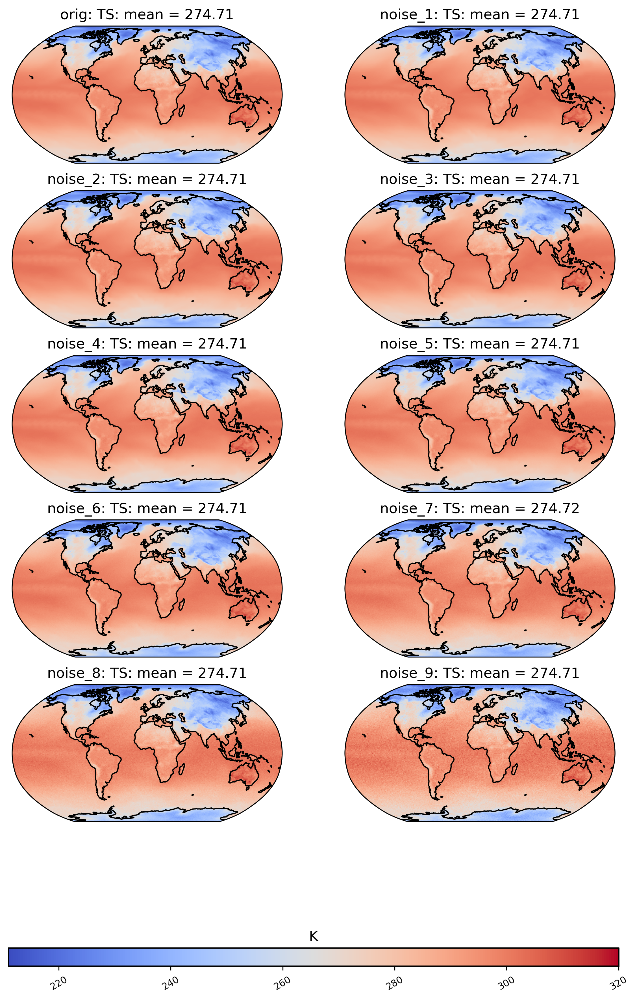

In [16]:
# without weighted means
ldcpy.plot(noise_ds, "TS", sets=["orig", "noise_1", "noise_2",
                                     "noise_3", "noise_4", "noise_5",
                                     "noise_6", "noise_7", "noise_8",
                                     "noise_9"], calc="mean", weighted=False)

In [17]:
# da = ds.sel(collection="orig")#.expand_dims(dim="time")
# reverse_lat_da = da
# reverse_lat_da["lat"] = da.lat[::-1]

# reverse_lon_da = da
# reverse_lon_da["lon"] = da.lon[::-1]

# reverse_lat_lon_da = da
# reverse_lat_lon_da["lon"] = da.lon[::-1]
# reverse_lat_lon_da["lat"] = da.lat[::-1]

# reverse_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
#                        [da, reverse_lat_da, reverse_lon_da, reverse_lat_lon_da],
#                                   ["orig", "reverse_lat", "reverse_lon", "reverse_lat_lon"])
# reverse_ds.attrs["file_size"] = None

# Reversed Comparison (Visuals and Metrics)


In [5]:
da = ds.sel(collection="orig")#.expand_dims(dim="time")
reverse_lat_da = da.copy()
reverse_lat_da["lat"] = da.lat[::-1]


reverse_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [da, reverse_lat_da],
                                  ["orig", "reverse_lat"])
reverse_ds.attrs["file_size"] = None

NameError: name 'ds' is not defined

In [19]:
# without weighted means
ldcpy.compare_stats(reverse_ds, "TS", ["orig", "reverse_lat"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,reverse_lat
mean,274.714,274.714
variance,534.006,534.006
standard deviation,23.1088,23.1088
min value,216.741,216.741
max value,315.584,315.584
probability positive,1,1
number of zeros,0,0
spatial autocorr - latitude,0.993918,0.993918
spatial autocorr - longitude,0.996801,0.996801
entropy estimate,0.414723,0.413649


,reverse_lat
max abs diff,64.0742
min abs diff,3.05176e-05
mean abs diff,13.7017
mean squared diff,0
root mean squared diff,19.2959
normalized root mean squared diff,0.195218
normalized max pointwise error,0.648244
pearson correlation coefficient,0.651378
ks p-value,1
spatial relative error(% > 0.0001),99.5407


274.7137027669836
274.7137027669836


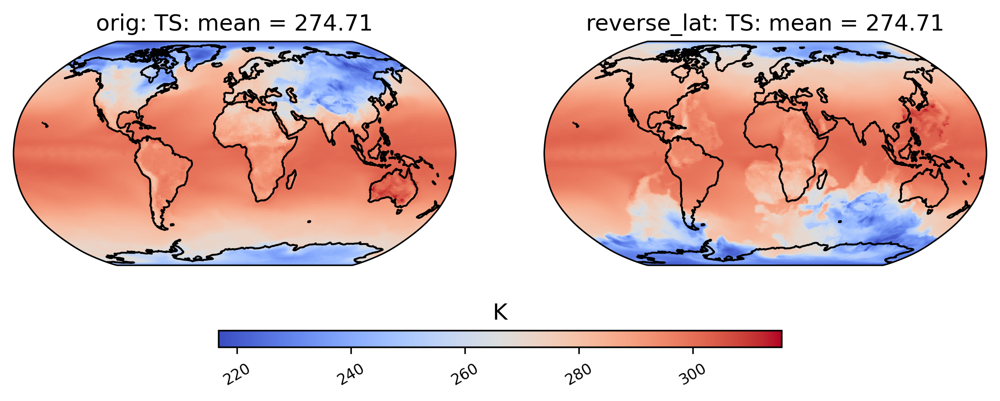

In [20]:
ldcpy.plot(reverse_ds, "TS", sets=["orig", "reverse_lat"], calc="mean", weighted=False)

# Single Point Altered Comparison (Visuals and Metrics)


In [217]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["TS"]

point_altered_da = da.copy().load()
print(point_altered_da[0,0,0].values)
point_altered_da[0,0,0] = 1000000


point_altered_da3 = da.copy().load()
point_altered_da3[0,0,0] = 292.21022


point_altered_da2 = da.copy().load()
point_altered_da2[0,10,10] = 1000000


242.21022


In [220]:
da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                       point_altered_da3.to_dataset()],
                                  ["orig", "altered", "altered2", "altered3"])
altered_ds.attrs["file_size"] = None

dataset size in GB 0.00



In [221]:
# without weighted means
ldcpy.compare_stats(altered_ds, "TS", ["orig", "altered", "altered2", "altered3"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3
mean,274.714,292.794,292.794,274.715
variance,534.006,1.80748e+07,1.80748e+07,533.992
standard deviation,23.1088,4251.48,4251.48,23.1085
min value,216.741,216.741,216.741,216.741
max value,315.584,1e+06,1e+06,315.584
probability positive,1,1,1,1
number of zeros,0,0,0,0
spatial autocorr - latitude,0.993918,-0.000755165,-4.38833e-05,0.993874
spatial autocorr - longitude,0.996801,-5.17667e-05,-4.24301e-05,0.996719
entropy estimate,0.414723,0.414743,0.414734,0.414741


,altered,altered2,altered3
max abs diff,999758,999752,50
min abs diff,0,0,0
mean abs diff,18.0801,18.08,0.000904224
mean squared diff,326.89,326.887,8.17622e-07
root mean squared diff,4251.56,4251.53,0.212629
normalized root mean squared diff,43.0133,43.0131,0.00215119
normalized max pointwise error,0,0,0
pearson correlation coefficient,-0.000546195,0.000505457,0.999958
ks p-value,1,1,1
spatial relative error(% > 0.0001),0.00180845,0.00180845,0.00180845


274.7137027669836
292.79381325923737
292.79370991775284


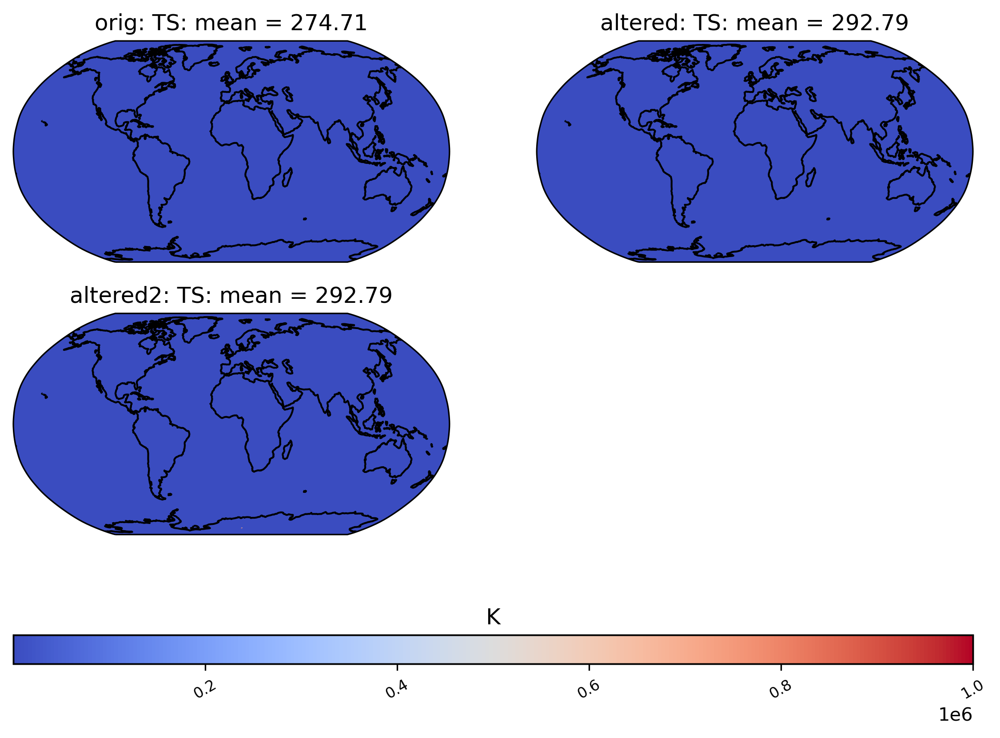

In [222]:
ldcpy.plot(altered_ds, "TS", sets=["orig", "altered", "altered2"], calc="mean", weighted=False)



# Small Addition Comparison (Visuals and Metrics)


dataset size in GB 0.00

Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2
mean,274.714,275.714,274.729
variance,534.006,534.006,534.006
standard deviation,23.1088,23.1088,23.1088
min value,216.741,217.741,216.757
max value,315.584,316.584,315.6
probability positive,1,1,1
number of zeros,0,0,0
spatial autocorr - latitude,0.993918,0.993918,0.993918
spatial autocorr - longitude,0.996801,0.996801,0.996801
entropy estimate,0.414723,0.414526,0.414714


,altered,altered2
max abs diff,1.00002,0.0157928
min abs diff,0.999985,0.0157776
mean abs diff,1,0.0157776
mean squared diff,1,0.000248932
root mean squared diff,1,0.0157776
normalized root mean squared diff,0.0101171,0.000159623
normalized max pointwise error,0.0101169,0.000159623
pearson correlation coefficient,1,1
ks p-value,2.50962e-42,1
spatial relative error(% > 0.0001),100,0


274.7137027669836
275.7137027672595
274.729480355978


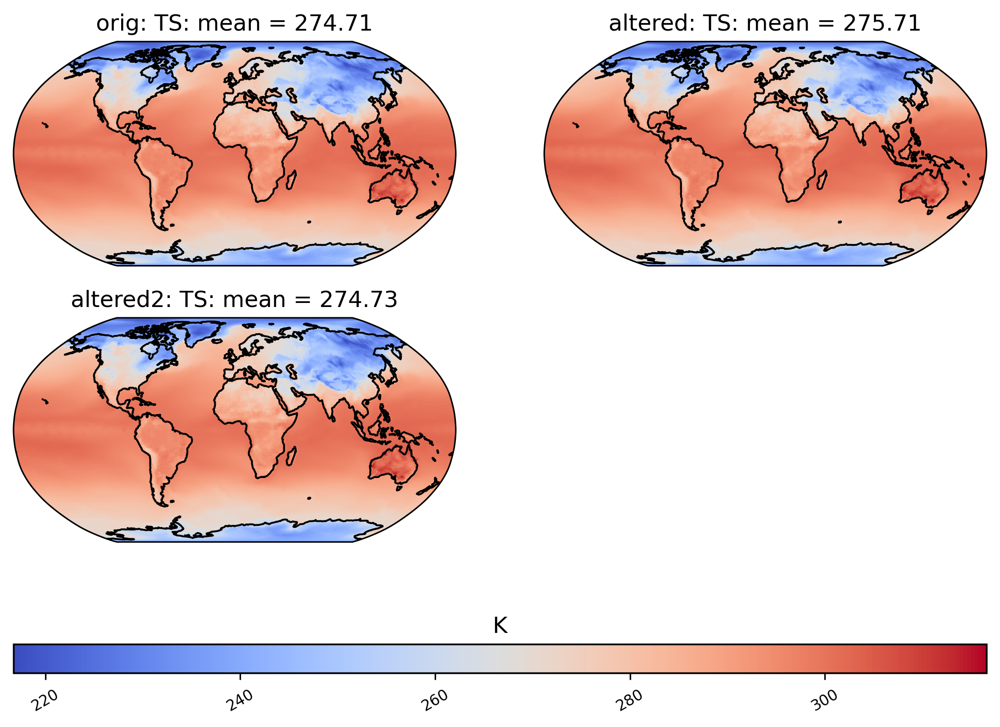

In [226]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["TS"]

point_altered_da = da.copy().load()
point_altered_da[:,:,:] = point_altered_da[:,:,:] + 1


point_altered_da2 = da.copy().load()
point_altered_da2[:,:,:] = point_altered_da2[:,:,:] + (np.max(point_altered_da2[:,:,:]) * 0.00005)

da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset()],
                                  ["orig", "altered", "altered2"])
altered_ds.attrs["file_size"] = None

# without weighted means
ldcpy.compare_stats(altered_ds, "TS", ["orig", "altered", "altered2"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "TS", sets=["orig", "altered", "altered2"], calc="mean", weighted=False)

# Small Region Altered Comparison (Visuals and Metrics)


In [224]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["TS"]

point_altered_da = da.copy().load()
point_altered_da[:,20:100:,20:60] = point_altered_da[:,20:100:,20:60] + (point_altered_da[:,20:100:,20:60] * .00005)


point_altered_da2 = da.copy().load()
point_altered_da2[:,20:100:,20:60] = point_altered_da2[:,20:100:,20:60] + (point_altered_da2[:,20:100:,20:60] * .00011)



point_altered_da3 = da.copy().load()
point_altered_da3[:,20:100:,20:60] = point_altered_da3[:,20:100:,20:60] + (point_altered_da3[:,20:100:,20:60] * .0002)


point_altered_da4 = da.copy().load()
point_altered_da4[:,20:100:,20:60] = point_altered_da4[:,20:100:,20:60] + (point_altered_da4[:,20:100:,20:60] * 1)


point_altered_da5 = da.copy().load()
point_altered_da5[:,30:70,250:287] = point_altered_da5[:,30:70,250:287] + (point_altered_da5[:,30:70,250:287] * .00011)
point_altered_da5[:,35:70,50:90] = point_altered_da5[:,35:70,50:90] + (point_altered_da5[:,35:70,50:90] * .00011)

point_altered_da6 = da.copy().load()
point_altered_da6[:,30:70,250:287] = point_altered_da6[:,30:70,250:287] + (point_altered_da6[:,30:70,250:287] * 1)
point_altered_da6[:,35:70,50:90] = point_altered_da6[:,35:70,50:90] + (point_altered_da6[:,35:70,50:90] * 1)


da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                        point_altered_da3.to_dataset(), point_altered_da4.to_dataset(), point_altered_da5.to_dataset(),
                       point_altered_da6.to_dataset()],
                                  ["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"])
altered_ds.attrs["file_size"] = None


dataset size in GB 0.00



Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3,altered4,altered5,altered6
mean,274.714,274.715,274.716,274.717,291.359,274.715,289.578
variance,534.006,534.028,534.055,534.095,5500.27,534.041,4880.99
standard deviation,23.1088,23.1093,23.1098,23.1107,74.1645,23.1095,69.8647
min value,216.741,216.741,216.741,216.741,216.741,216.741,216.741
max value,315.584,315.584,315.584,315.584,605.288,315.584,596.575
probability positive,1,1,1,1,1,1,1
number of zeros,0,0,0,0,0,0,0
spatial autocorr - latitude,0.993918,0.993918,0.993918,0.993918,0.989115,0.993918,0.975943
spatial autocorr - longitude,0.996801,0.996801,0.996801,0.996801,0.97798,0.996801,0.976938
entropy estimate,0.414723,0.414761,0.414761,0.414743,0.420062,0.414759,0.418581


,altered,altered2,altered3,altered4,altered5,altered6
max abs diff,0.0151367,0.0332947,0.0605164,302.644,0.0328064,298.287
min abs diff,0,0,0,0,0,0
mean abs diff,0.00083227,0.00183099,0.00332906,16.6454,0.00163505,14.8641
mean squared diff,6.92674e-07,3.35252e-06,1.10826e-05,277.069,2.67338e-06,220.943
root mean squared diff,0.00346276,0.00761804,0.0138509,69.255,0.00716677,65.1529
normalized root mean squared diff,3.5033e-05,7.70723e-05,0.000140131,0.700658,7.25068e-05,0.659157
normalized max pointwise error,0,0,0,0,0,0
pearson correlation coefficient,1,1,1,0.442023,1,0.430807
ks p-value,1,1,1,6.31015e-81,1,1.26754e-65
spatial relative error(% > 0.0001),0,5.78704,5.78704,5.78704,5.20833,5.20833


274.7137027669836
274.71453503740054
274.71553375571966
274.71703182629966
291.35907844895564
274.71533781345244
289.577851165224


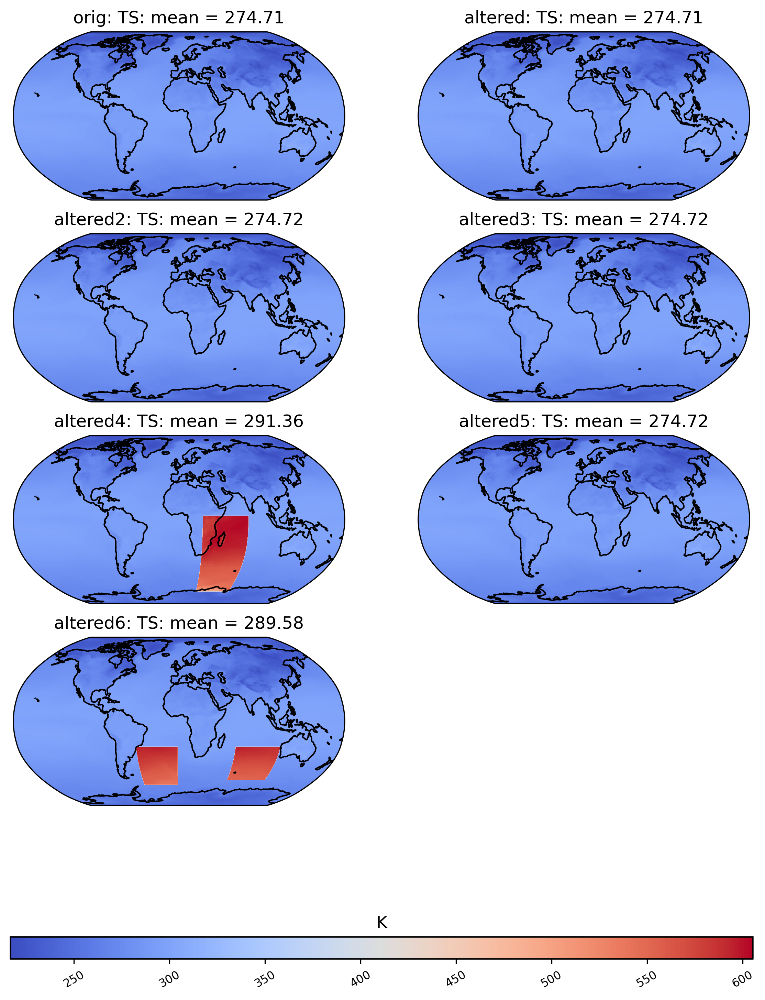

In [142]:
# without weighted means
ldcpy.compare_stats(altered_ds, "TS", ["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "TS", sets=["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"], calc="mean", weighted=False)

# Type Conversion Comparison (Visuals and Metrics)


In [239]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["TS"]

point_altered_da = da.astype(np.double)
point_altered_da2 = da.astype(np.float16)
point_altered_da3 = da.astype(np.short)
point_altered_da4 = da.astype(np.ushort)



da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                       point_altered_da3.to_dataset(), point_altered_da4.to_dataset(),],
                                  ["orig", "altered", "altered2", "altered3", "altered4"])
altered_ds.attrs["file_size"] = None


dataset size in GB 0.22



Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3,altered4
mean,274.714,274.714,274.714,274.212,274.212
variance,534.006,534.006,534,534.168,534.168
standard deviation,23.1088,23.1088,23.1087,23.1123,23.1123
min value,216.741,216.741,216.75,216,216
max value,315.584,315.584,315.5,315,315
probability positive,1,1,1,1,1
number of zeros,0,0,0,0,0
spatial autocorr - latitude,0.993918,0.993918,0.99391,0.993758,0.993758
spatial autocorr - longitude,0.996801,0.996801,0.996793,0.996677,0.996677
entropy estimate,0.414723,0.414723,0.109339,0.0564327,0.0564327


,altered,altered2,altered3,altered4
max abs diff,0,0.125,0.999985,0.999985
min abs diff,0,0,6.10352e-05,6.10352e-05
mean abs diff,0,0.0550531,0.5013,0.5013
mean squared diff,0,4.48983e-08,0.251302,0.251302
root mean squared diff,0,0.0653734,0.579266,0.579266
normalized root mean squared diff,0,0.000661388,0.00586048,0.00586048
normalized max pointwise error,0,0.00126463,0.0101169,0.0101169
pearson correlation coefficient,1,0.999996,0.999921,0.999921
ks p-value,1,0.352438,2.90692e-39,2.90692e-39
spatial relative error(% > 0.0001),0,73.6762,97.2313,97.2313


274.99505609250735
274.99505609250735
274.9950442391855
274.49455186631945
274.49455186631945


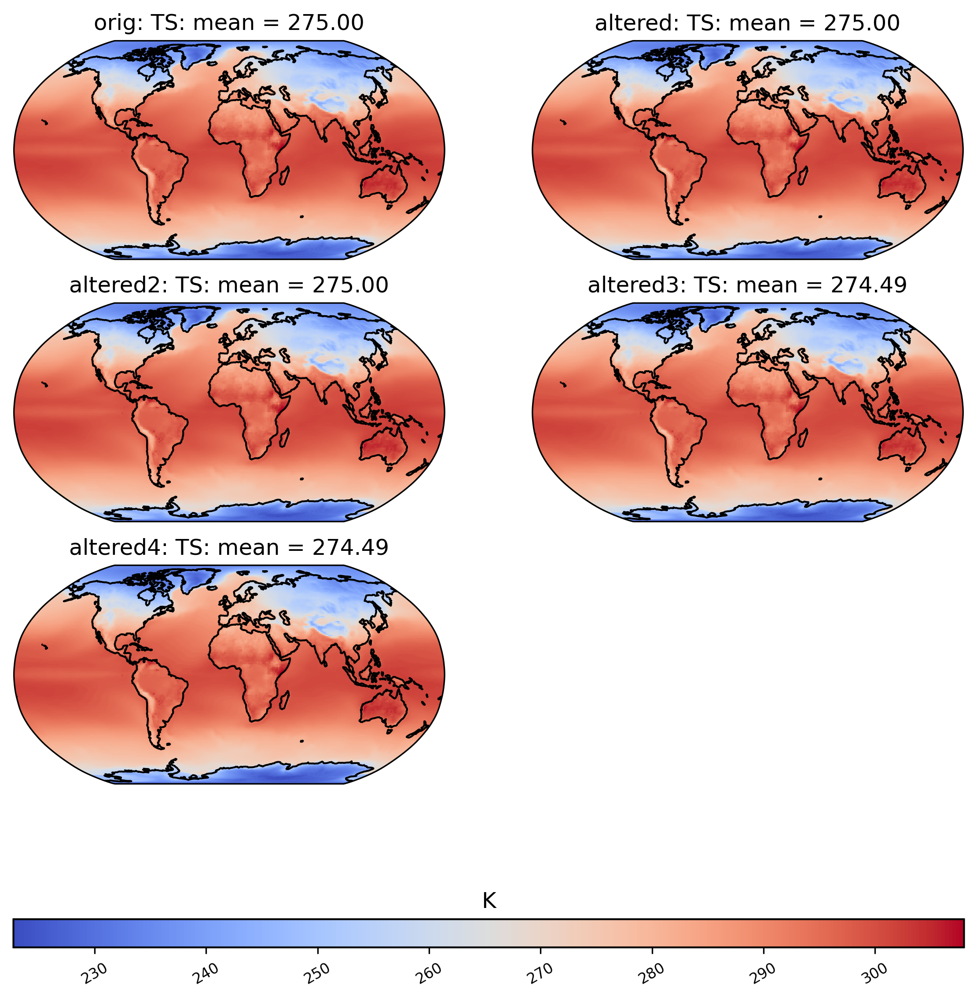

In [240]:
# without weighted means
ldcpy.compare_stats(altered_ds, "TS", ["orig", "altered", "altered2", "altered3", "altered4"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "TS", sets=["orig", "altered", "altered2", "altered3", "altered4"], calc="mean", weighted=False)

# Round to Zero Comparison (Visuals and Metrics)

In [247]:
import xarray as xr
import numpy as np
import dask
import dask.array as da

d = ds.sel(collection="orig")["TS"]

point_altered_da = d.copy().load()
#point_altered_da[da.where(point_altered_da < 0.001)] = 0

point_altered_da2 = d.copy().load()
point_altered_da2[da.where(point_altered_da2 < np.min(point_altered_da2.values) * 1.005)] = 0


d = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
                       [d, point_altered_da.to_dataset(), point_altered_da2.to_dataset()],
                                  ["orig", "altered", "altered2"])
altered_ds.attrs["file_size"] = None


dataset size in GB 0.00



Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2
mean,274.714,274.714,274.706
variance,534.006,534.006,536.616
standard deviation,23.1088,23.1088,23.1652
min value,216.741,216.741,0
max value,315.584,315.584,315.584
probability positive,1,1,0.999964
number of zeros,0,0,2
spatial autocorr - latitude,0.993918,0.993918,0.992282
spatial autocorr - longitude,0.996801,0.996801,0.993591
entropy estimate,0.414723,0.414723,0.414727


,altered,altered2
max abs diff,0,217.575
min abs diff,0,0
mean abs diff,0,0.00785438
mean squared diff,0,6.16912e-05
root mean squared diff,0,1.306
normalized root mean squared diff,0,0.0132129
normalized max pointwise error,0,2.20122
pearson correlation coefficient,1,0.99841
ks p-value,1,1
spatial relative error(% > 0.0001),0,0.0036169


274.7137027669836
274.7137027669836
274.7058483905814


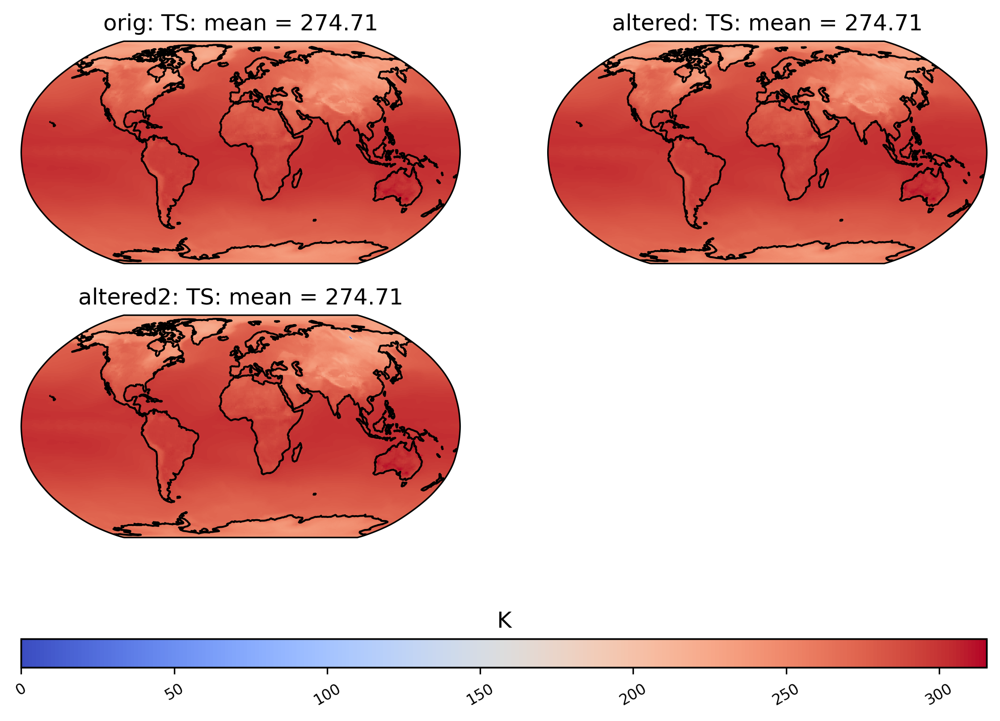

In [245]:
# without weighted means
ldcpy.compare_stats(altered_ds, "TS", ["orig", "altered", "altered2"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "TS", sets=["orig", "altered", "altered2"], calc="mean", weighted=False)